[Table of Contents](./table_of_contents.ipynb)

# Ensemble Kalman Filters

In [1]:
%matplotlib inline
from __future__ import division, print_function
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

Text(0.5,0.92,'Lorenz Attractor')

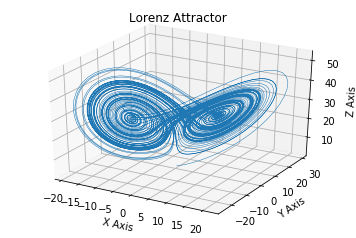

In [2]:
def lorenz(x, y, z, s=10, r=28, b=2.667):
    x_dot = s*(y - x)
    y_dot = r*x - y - x*z
    z_dot = x*y - b*z
    return x_dot, y_dot, z_dot

dt = 0.01
stepCnt = 10000

# Need one more for the initial values
xs = np.empty((stepCnt + 1,))
ys = np.empty((stepCnt + 1,))
zs = np.empty((stepCnt + 1,))

# Setting initial values
xs[0], ys[0], zs[0] = (0., 1., 1.05)

# Stepping through "time".
for i in range(stepCnt):
    x_dot, y_dot, z_dot = lorenz(xs[i], ys[i], zs[i])
    # update
    xs[i + 1] = xs[i] + (x_dot * dt)
    ys[i + 1] = ys[i] + (y_dot * dt)
    zs[i + 1] = zs[i] + (z_dot * dt)

fig = plt.figure()
ax = fig.gca(projection='3d')

ax.plot(xs, ys, zs, lw=0.5)
ax.set_xlabel("X Axis")
ax.set_ylabel("Y Axis")
ax.set_zlabel("Z Axis")
ax.set_title("Lorenz Attractor")


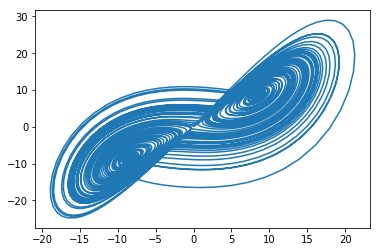

In [3]:
plt.plot(xs,ys)

In [7]:
pwd

'/home/mcano/dev/kalman'

# Asimilación

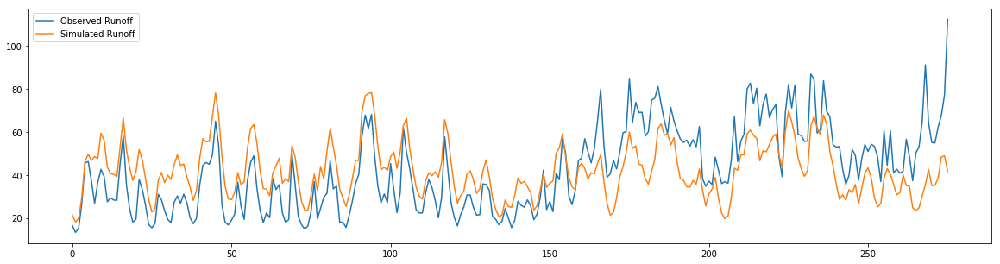

In [12]:
# -*- coding: utf-8 -*-
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

def Xiong(EP,P,c,SC,Area,So=1700):
    '''MONTHLY WATER BALANCE MODEL
    INPUTS:
    EP = Pan evaporation, array-like, mm/month
    P = Monthly rainfall, array-like, mm/month
    Area = Catchment area, float, m^2
    So = Initial water content in soil - initial condition for the model,float,mm/month
    MODEL PARAMETERS
    c = Change of time scale parameter,float
    SC = Field Capacity in the catchment,float,mm
    OUTPUTS
    Q = Simulated runoff,list-like,m^3/s
    '''
    EP=EP*Area*3.858e-4
    P =Area*P*3.858e-4
    S=[So] # Water storage
    Q=[]
    for i in range(len(P)):
        Ei = c*EP[i]*np.tanh(P[i]/EP[i]) # Evapotranspiration
        Qi =(S[-1]+P[i]-Ei)*np.tanh((S[-1]+P[i]-Ei)/SC)
        Q.append(Qi)
        S.append(S[-1]+P[i]-Ei-Qi)
    return Q

df = pd.read_csv('Example_Data.csv',index_col=0)
df.index = pd.to_datetime(df.index)
P = df['P'].values # monthly rainfall
EP = df['EP'].values # monthly pan evaporation - Cenicafe Method
Qo = df['Qo'].values # monthly measured runoff

Qs = Xiong(EP,P,8.71259,1800,862.69,So=200)
fig = plt.figure(figsize=(20,5))
plt.plot((Qo),label='Observed Runoff')
plt.plot(Qs,label='Simulated Runoff')
plt.legend(loc='best')
plt.show()

In [ ]:
# -*- coding: utf-8 -*-
# pylint: disable=invalid-name, too-many-arguments, too-many-instance-attributes
# pylint: disable=attribute-defined-outside-init

"""Copyright 2015 Roger R Labbe Jr.

FilterPy library.
http://github.com/rlabbe/filterpy

Documentation at:
https://filterpy.readthedocs.org

Supporting book at:
https://github.com/rlabbe/Kalman-and-Bayesian-Filters-in-Python

This is licensed under an MIT license. See the readme.MD file
for more information.
"""


from __future__ import (absolute_import, division, print_function,
                        unicode_literals)

from copy import deepcopy
import numpy as np
from numpy import array, zeros, eye, dot
from numpy.random import multivariate_normal
from filterpy.common import pretty_str, outer_product_sum


class EnsembleKalmanFilter(object):
    """
    This implements the ensemble Kalman filter (EnKF). The EnKF uses
    an ensemble of hundreds to thousands of state vectors that are randomly
    sampled around the estimate, and adds perturbations at each update and
    predict step. It is useful for extremely large systems such as found
    in hydrophysics. As such, this class is admittedly a toy as it is far
    too slow with large N.

    There are many versions of this sort of this filter. This formulation is
    due to Crassidis and Junkins [1]. It works with both linear and nonlinear
    systems.

    Parameters
    ----------

    x : np.array(dim_x)
        state mean

    P : np.array((dim_x, dim_x))
        covariance of the state

    dim_z : int
        Number of of measurement inputs. For example, if the sensor
        provides you with position in (x,y), dim_z would be 2.

    dt : float
        time step in seconds

    N : int
        number of sigma points (ensembles). Must be greater than 1.

    K : np.array
        Kalman gain

    hx : function hx(x)
        Measurement function. May be linear or nonlinear - converts state
        x into a measurement. Return must be an np.array of the same
        dimensionality as the measurement vector.

    fx : function fx(x, dt)
        State transition function. May be linear or nonlinear. Projects
        state x into the next time period. Returns the projected state x.


    Attributes
    ----------
    x : numpy.array(dim_x, 1)
        State estimate

    P : numpy.array(dim_x, dim_x)
        State covariance matrix

    x_prior : numpy.array(dim_x, 1)
        Prior (predicted) state estimate. The *_prior and *_post attributes
        are for convienence; they store the  prior and posterior of the
        current epoch. Read Only.

    P_prior : numpy.array(dim_x, dim_x)
        Prior (predicted) state covariance matrix. Read Only.

    x_post : numpy.array(dim_x, 1)
        Posterior (updated) state estimate. Read Only.

    P_post : numpy.array(dim_x, dim_x)
        Posterior (updated) state covariance matrix. Read Only.

    z : numpy.array
        Last measurement used in update(). Read only.

    R : numpy.array(dim_z, dim_z)
        Measurement noise matrix

    Q : numpy.array(dim_x, dim_x)
        Process noise matrix

    fx : callable (x, dt)
        State transition function

    hx : callable (x)
        Measurement function. Convert state `x` into a measurement

    K : numpy.array(dim_x, dim_z)
        Kalman gain of the update step. Read only.

    inv : function, default numpy.linalg.inv
        If you prefer another inverse function, such as the Moore-Penrose
        pseudo inverse, set it to that instead: kf.inv = np.linalg.pinv

    Examples
    --------

    .. code-block:: Python

        def hx(x):
           return np.array([x[0]])

        F = np.array([[1., 1.],
                      [0., 1.]])
        def fx(x, dt):
            return np.dot(F, x)

        x = np.array([0., 1.])
        P = np.eye(2) * 100.
        dt = 0.1
        f = EnsembleKalmanFilter(x=x, P=P, dim_z=1, dt=dt,
                                 N=8, hx=hx, fx=fx)

        std_noise = 3.
        f.R *= std_noise**2
        f.Q = Q_discrete_white_noise(2, dt, .01)

        while True:
            z = read_sensor()
            f.predict()
            f.update(np.asarray([z]))

    See my book Kalman and Bayesian Filters in Python
    https://github.com/rlabbe/Kalman-and-Bayesian-Filters-in-Python

    References
    ----------

    - [1] John L Crassidis and John L. Junkins. "Optimal Estimation of
      Dynamic Systems. CRC Press, second edition. 2012. pp, 257-9.
    """

    def __init__(self, x, P, dim_z, dt, N, hx, fx):
        if dim_z <= 0:
            raise ValueError('dim_z must be greater than zero')

        if N <= 0:
            raise ValueError('N must be greater than zero')

        dim_x = len(x)
        self.dim_x = dim_x
        self.dim_z = dim_z
        self.dt = dt
        self.N = N
        self.hx = hx
        self.fx = fx
        self.K = zeros((dim_x, dim_z))
        self.z = array([[None] * self.dim_z]).T
        self.S = zeros((dim_z, dim_z))   # system uncertainty
        self.SI = zeros((dim_z, dim_z))  # inverse system uncertainty

        self.initialize(x, P)
        self.Q = eye(dim_x)       # process uncertainty
        self.R = eye(dim_z)       # state uncertainty
        self.inv = np.linalg.inv

        # used to create error terms centered at 0 mean for
        # state and measurement
        self._mean = zeros(dim_x)
        self._mean_z = zeros(dim_z)

    def initialize(self, x, P):
        """
        Initializes the filter with the specified mean and
        covariance. Only need to call this if you are using the filter
        to filter more than one set of data; this is called by __init__

        Parameters
        ----------

        x : np.array(dim_z)
            state mean

        P : np.array((dim_x, dim_x))
            covariance of the state
        """

        if x.ndim != 1:
            raise ValueError('x must be a 1D array')

        self.sigmas = multivariate_normal(mean=x, cov=P, size=self.N)
        self.x = x
        self.P = P

        # these will always be a copy of x,P after predict() is called
        self.x_prior = self.x.copy()
        self.P_prior = self.P.copy()

        # these will always be a copy of x,P after update() is called
        self.x_post = self.x.copy()
        self.P_post = self.P.copy()

    def update(self, z, R=None):
        """
        Add a new measurement (z) to the kalman filter. If z is None, nothing
        is changed.

        Parameters
        ----------

        z : np.array
            measurement for this update.

        R : np.array, scalar, or None
            Optionally provide R to override the measurement noise for this
            one call, otherwise self.R will be used.
        """

        if z is None:
            self.z = array([[None]*self.dim_z]).T
            self.x_post = self.x.copy()
            self.P_post = self.P.copy()
            return

        if R is None:
            R = self.R
        if np.isscalar(R):
            R = eye(self.dim_z) * R

        N = self.N
        dim_z = len(z)
        sigmas_h = zeros((N, dim_z))

        # transform sigma points into measurement space
        for i in range(N):
            sigmas_h[i] = self.hx(self.sigmas[i])

        z_mean = np.mean(sigmas_h, axis=0)

        P_zz = (outer_product_sum(sigmas_h - z_mean) / (N-1)) + R
        P_xz = outer_product_sum(
                self.sigmas - self.x, sigmas_h - z_mean) / (N - 1)
        P_pz = outer_product_sum(
        #self.sigmasp - self.p, sigmas_h - z_mean)

        self.S = P_zz
        self.SI = self.inv(self.S)
        self.K = dot(P_xz, self.SI)

        e_r = multivariate_normal(self._mean_z, R, N)
        for i in range(N):
            self.sigmas[i] += dot(self.K, z + e_r[i] - sigmas_h[i])

        self.x = np.mean(self.sigmas, axis=0)
        self.P = self.P - dot(dot(self.K, self.S), self.K.T)

        # save measurement and posterior state
        self.z = deepcopy(z)
        self.x_post = self.x.copy()
        self.P_post = self.P.copy()

    def predict(self):
        """ Predict next position. """

        N = self.N
        for i, s in enumerate(self.sigmas):
            self.sigmas[i] = self.fx(s, self.dt)

        e = multivariate_normal(self._mean, self.Q, N)
        self.sigmas += e

        self.x = np.mean(self.sigmas, axis=0)
        self.P = outer_product_sum(self.sigmas - self.x) / (N - 1)

        # save prior
        self.x_prior = np.copy(self.x)
        self.P_prior = np.copy(self.P)

    def __repr__(self):
        return '\n'.join([
            'EnsembleKalmanFilter object',
            pretty_str('dim_x', self.dim_x),
            pretty_str('dim_z', self.dim_z),
            pretty_str('dt', self.dt),
            pretty_str('x', self.x),
            pretty_str('P', self.P),
            pretty_str('x_prior', self.x_prior),
            pretty_str('P_prior', self.P_prior),
            pretty_str('Q', self.Q),
            pretty_str('R', self.R),
            pretty_str('K', self.K),
            pretty_str('S', self.S),
            pretty_str('sigmas', self.sigmas),
            pretty_str('hx', self.hx),
            pretty_str('fx', self.fx)
            ])

In [6]:
import os
import numpy as np
from math import radians
from math import radians, sin, cos
import math
from math import sqrt, exp
import pandas as pd
from math import sin, cos, radians
import kf_book.book_plots as bp
from numpy.random import randn
from filterpy.kalman import EnsembleKalmanFilter as EnKF
from filterpy.kalman import KalmanFilter
from filterpy.common import Q_discrete_white_noise

np.random.seed(1234)
# Filter initial conditions
dt = 0.01
r = 0.5
q = 1

kf = KalmanFilter(dim_x=6, dim_z=3, dim_u=1)

kf.F = np.array([[1., dt, 0., 0., 0., 0.],   # x   = x0 + dx*dt
                 [0., 1., 0., 0., 0., 0.],   # dx  = dx0
                 [0., 0., 1., dt, 0., 0.],   # y   = y0 + dy*dt
                 [0., 0., 0., 1., 0., 0.],
                 [0., 0., 0., 0., 1., dt],
                 [0., 0., 0., 0., 0., 1.]])  # dy  = dy0

kf.H = np.array([[1., 0., 0., 0., 0., 0.],
                 [0., 0., 1., 0., 0., 0.],
             [0., 0., 0., 0., 1., 0.]])
kf.R *= r
kf.Q *= q 


def hx(x):
    return np.array([x[0],x[2],x[4]])

def fx(x, dt):
    s = 10
    r = 28.
    b = 2.667
    xout = np.empty_like(x)
    xout[0] = x[0] + x[0]*dt
    xout[2] = x[2] + x[2]*dt
    xout[4] = x[4] + x[4]*dt
    xout[1] = s*(x[2]-x[0])
    xout[3] = r*x[0] - x[2] - x[0]*x[4]
    xout[5] = x[0]*x[2] - b*x[4]
    return xout

def lorenz_enkf(x,vx,y,vy,z,vz,dt,N,P,hx,fx,r, q):
    kf = EnKF(x=np.array([x, vx, y, vy,z,vz]),P=P,dt=dt,dim_z=3,N=30,hx=hx,fx=fx)
    kf.R *= r
    kf.Q *= q
    return kf

In [ ]:
Qs = Xiong(EP,P,8.71259,1800,862.69,So=200)
fig = plt.figure(figsize=(20,5))
plt.plot((Qo),label='Observed Runoff')
plt.plot(Qs,label='Simulated Runoff')
plt.legend(loc='best')
plt.show()

In [5]:
# 1. condiciones iniciales 
# 1.1 modelo
x  = 10
y  = 5.0
z  = 1.0
vx = 0
vy = 0
vz = 0
dt = 0.01  # time step
# 1.2 EnKf
q = 0.1 # model error
r = 0.1 # measuremet error
N = 30  # ensembles
# 2. initialize models
# lorenz model
#lorenz = Lorenz(x,vx,y,vy,z,vz,dt)
# Kalman Filter 
kf = KalmanFilter(dim_x=6, dim_z=3, dim_u=1)
kf.F = np.array([[1., dt, 0., 0., 0., 0.],   # x   = x0 + dx*dt
                 [0., 1., 0., 0., 0., 0.],   # dx  = dx0
                 [0., 0., 1., dt, 0., 0.],   # y   = y0 + dy*dt
                 [0., 0., 0., 1., 0., 0.],
                 [0., 0., 0., 0., 1., dt],
                 [0., 0., 0., 0., 0., 1.]])  # dy  = dy0

kf.H = np.array([[1., 0., 0., 0., 0., 0.],
                 [0., 0., 1., 0., 0., 0.],
                 [0., 0., 0., 0., 1., 0.]])
kf.R *= r
kf.Q *= q 

EnKf = lorenz_enkf(x,vx,y,vy,z,vz,dt=dt,P=kf.P,N = N,hx=hx,fx=fx,r=r, q=q)

# storage
sigmas = [EnKf.sigmas]
covs   = [EnKf.P]
states = [EnKf.x]
zs = []
contador = 1
t = 0   # initial time

ns = 100*7+80+10000
xs=[0]
ys=[1]
zs = [1.05]
vxs = []
vys = []
vzs = []

for i in range(ns):
    vx,vy,vz = lorenz(xs[i],ys[i],zs[i])
    xs.append(xs[i] + (vx * dt))
    ys.append(ys[i] + (vy * dt))
    zs.append(zs[i] + (vz * dt))
    vxs.append(vx)
    vys.append(vy)
    vzs.append(vz)

for i in range(ns):
    t += dt
    # inputs
    x,y,z = xs[i],ys[i],zs[i]
    EnKf.update(np.array([x,y,z]))
    # append
    states.append(EnKf.x)
    sigmas.append(EnKf.sigmas.copy())
    covs.append(EnKf.P)
    EnKf.predict()
    contador += 1
    
states = np.array(states)
covs = np.array(covs)
zs = np.array(zs)

In [51]:
x_s,y_s,z_s = states[:,0],states[:,2],states[:,4]

In [52]:
ns = 100*7+80+1000
xs=[0]
ys=[1]
zs = [1.05]
vxs = []
vys = []
vzs = []

for i in range(ns):
    vx,vy,vz = lorenz(xs[i],ys[i],zs[i])
    xs.append(xs[i] + (vx * dt))
    ys.append(ys[i] + (vy * dt))
    zs.append(zs[i] + (vz * dt))
    vxs.append(vx)
    vys.append(vy)
    vzs.append(vz)
    

xs2=[0]
ys2=[1.00001]
zs2 = [1.05]
vxs2 = []
vys2 = []
vzs2 = []

for i in range(ns):
    vx,vy,vz = lorenz(xs2[i],ys2[i],zs2[i])
    xs2.append(xs2[i] + (vx * dt))
    ys2.append(ys2[i] + (vy * dt))
    zs2.append(zs2[i] + (vz * dt))
    vxs2.append(vx)
    vys2.append(vy)
    vzs2.append(vz)

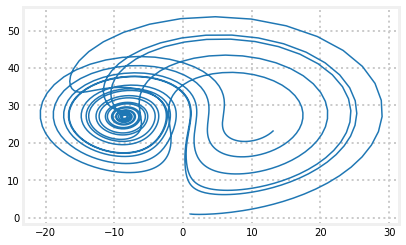

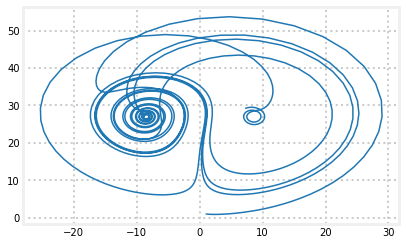

In [53]:
#plt.scatter(x_s,z_s,color='r')
plt.plot(ys,zs)
plt.figure()
plt.plot(ys2,zs2)

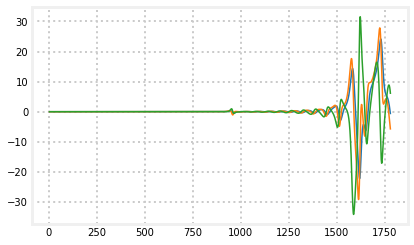

In [54]:
plt.plot(np.array(xs2)-np.array(xs))
plt.plot(np.array(ys2)-np.array(ys))
plt.plot(np.array(zs2)-np.array(zs))

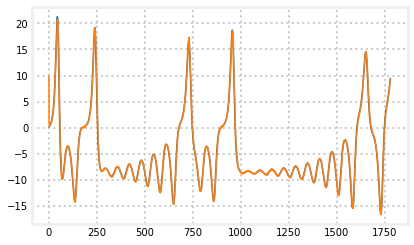

In [55]:
plt.plot(xs)
plt.plot(x_s[:len(xs)+1])

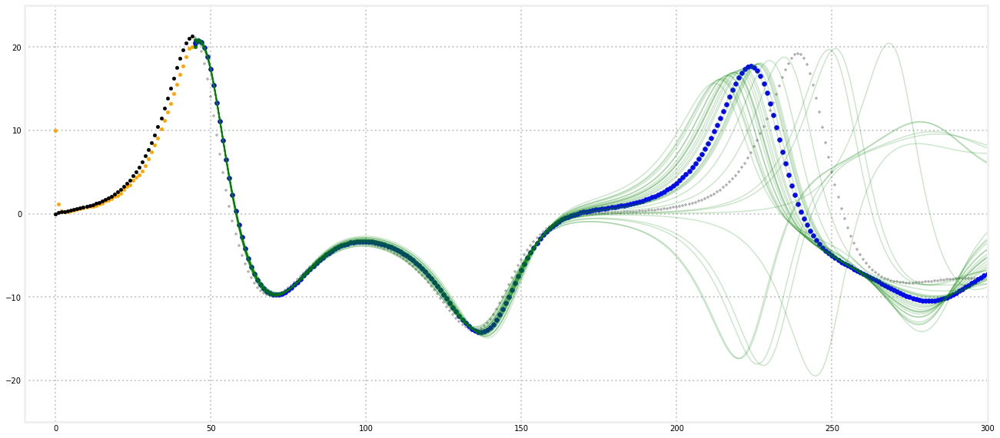

In [66]:
args = []
kwargs = {}
figsize=(20,10)
step = 45
contador = 0
font = 30
#def gif(step=4,contador=0,*args,figsize=(20,10),**kwargs):
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111)
plt.ylim(-25,25)
plt.xlim(-10,300)

ax.scatter(range(len(states[:,0][:step])),states[:,0][:step],label='Prior best estimates',color='orange',s=20)
ax.scatter(range(len(xs[:step])),xs[:step],label='Past measurements',color='black',s=20)
ax.scatter(range(step,len(xs[step:])+step),xs[step:],label='Future measurements',marker='+',alpha=0.3,color='black',s=20)
for scx,scy in zip(np.ones(len(sigmas[step][:,0]))*step,sigmas[step][:,0]):
    ax.scatter(scx,scy,color='green',s=20)

ensembles = sigmas[step][:,0]
posterior = states[step]
#posterior = np.array([xs[step],vxs[step],ys[step],vys[step],zs[step],vzs[step]])
ax.scatter(step,posterior[
    0],color='red',label='',s=30) 


#posterior = [xs[step],vxs[step],ys[step],vys[step],zs[step],vzs[step]]
#posterior 
def full_states(state):
    xp,yp,zp = [state[0]],[state[2]],[state[4]]
    vxp,vyp,vzp = [],[],[]
    for i,j in enumerate(range(len(xs))):
        vxpi,vypi,vzpi = lorenz(xp[i],yp[i],zp[i])
        xp.append(xp[i] + (vxpi * dt))
        yp.append(yp[i] + (vypi * dt))
        zp.append(zp[i] + (vzpi * dt))
        vxp.append(vxpi)
        vyp.append(vypi)
        vzp.append(vzpi)
    return [xp,vxp,yp,vyp,vz,vzp]

state_variables = full_states(posterior)
ax.scatter(range(step,len(state_variables[0])+step),state_variables[0],color='b')
for i in sigmas[step]:
    sts = full_states(i)
    ax.plot(range(step,len(sts[0])+step),sts[0],color='green',alpha=0.2)

In [ ]:

for sigma in sigmas[step]:
    st = ensembles(posterior)
    ax.plot(range(step,len(xp)+step),st[0],color='g',linewidth=1,alpha=0.3)

In [23]:
for sigma in sigmas[step:]:
    print(sigma)

[[  20.275   58.21    22.845 -329.319   46.199  356.887]
 [  20.57    55.532   22.72  -325.46    46.423  357.242]
 [  20.347   52.794   22.721 -334.613   46.581  364.225]
 [  20.691   53.927   23.112 -327.379   46.153  368.191]
 [  20.813   56.71    22.944 -334.027   46.774  366.792]
 [  20.309   61.12    22.984 -326.338   46.736  355.524]
 [  20.402   58.784   22.967 -320.413   45.981  360.191]
 [  20.697   56.222   22.882 -333.158   47.037  358.989]
 [  20.526   54.219   22.815 -328.97    46.332  366.984]
 [  20.413   56.574   23.288 -329.814   46.585  363.254]
 [  20.49    61.284   23.017 -319.616   46.821  344.549]
 [  20.565   59.345   22.94  -327.075   46.146  362.918]
 [  20.205   58.095   22.713 -315.847   45.867  350.089]
 [  20.739   56.571   23.033 -329.832   47.096  361.788]
 [  20.522   54.247   22.996 -331.147   46.161  367.88 ]
 [  20.02    55.918   22.624 -328.02    46.485  344.661]
 [  20.615   50.125   22.877 -338.788   46.391  363.853]
 [  20.734   47.439   23.099 -3

 [ -9.775 -56.815 -15.327 -59.706  20.098  78.536]]
[[-10.229 -55.89  -15.298 -59.229  20.912  94.951]
 [-10.419 -50.394 -15.652 -61.402  20.834 104.545]
 [-10.571 -53.125 -15.615 -59.584  21.185  99.518]
 [-10.362 -58.957 -15.866 -55.323  21.055 100.694]
 [-10.481 -51.568 -15.146 -59.937  20.728  94.874]
 [-10.063 -53.723 -15.557 -57.903  20.939  95.128]
 [-10.185 -58.111 -15.446 -58.549  21.027  97.37 ]
 [ -9.732 -51.738 -15.421 -54.382  21.415  91.875]
 [-10.743 -50.679 -15.139 -59.517  20.971  97.617]
 [-10.543 -54.015 -15.575 -54.346  21.787  92.922]
 [-10.102 -54.616 -15.362 -56.257  21.064  89.326]
 [-10.43  -49.737 -15.709 -61.868  20.799  96.125]
 [-10.543 -50.834 -15.58  -62.546  20.978 104.931]
 [-10.711 -52.97  -15.445 -56.555  21.458  94.017]
 [-10.432 -58.043 -16.14  -54.49   20.94   94.053]
 [-10.854 -52.335 -15.609 -60.224  21.164  97.899]
 [ -9.899 -56.293 -15.635 -56.371  21.179  90.6  ]
 [ -9.837 -54.66  -15.562 -57.59   20.696  89.492]
 [-10.647 -54.976 -15.69  -61.

[[ -8.325  -3.745  -8.639 -10.51   25.468   2.062]
 [ -8.258  -3.496  -8.558 -13.214  25.544   1.399]
 [ -8.307  -4.67   -8.706 -11.671  25.566   6.113]
 [ -7.938  -9.037  -9.018 -10.651  25.535  -0.164]
 [ -7.961  -7.151  -8.998 -10.127  25.717   5.808]
 [ -7.88   -4.704  -8.743 -11.232  25.604   1.759]
 [ -8.068  -6.301  -8.671 -10.29   25.763   3.926]
 [ -8.024  -4.915  -9.092 -11.564  26.039   6.071]
 [ -8.357  -4.921  -9.1   -10.562  25.534   1.12 ]
 [ -8.386  -6.187  -8.299  -9.706  25.863   1.631]
 [ -7.909  -7.088  -8.713 -14.334  25.445   2.428]
 [ -8.029  -8.325  -8.618 -12.375  25.372   4.781]
 [ -8.088  -3.025  -8.678 -12.016  25.726   1.509]
 [ -7.698 -10.38   -8.795  -8.476  25.589  -4.293]
 [ -7.968  -8.183  -8.581 -11.699  25.505   0.451]
 [ -8.322  -3.978  -8.794  -9.969  25.896   2.007]
 [ -8.506 -10.807  -8.867 -10.483  25.965   2.654]
 [ -7.752  -9.276  -8.707 -10.333  25.525  -4.699]
 [ -8.164  -4.837  -9.029  -9.408  26.065   3.873]
 [ -7.635  -5.53   -8.623 -11.1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[[ 8.012 10.995  9.938 16.018 25.598 15.489]
 [ 8.881  9.063  9.721 10.83  25.525 17.866]
 [ 8.725 13.88   9.884 11.867 25.679 16.088]
 [ 8.341 19.752 10.094 10.289 25.237 15.38 ]
 [ 9.182  9.619  9.924 12.867 25.332 17.423]
 [ 8.219 15.761  9.836 10.483 24.863 16.487]
 [ 8.153 13.353 10.052 13.917 25.427 15.592]
 [ 8.675 12.779  8.946  9.861 25.697 16.938]
 [ 9.088 10.809 10.62   9.143 26.019 15.323]
 [ 8.547 13.93   9.552 12.189 25.614 14.734]
 [ 8.401  9.681  9.676 11.524 25.6   14.984]
 [ 8.551 12.014  9.482 12.809 25.646 17.412]
 [ 8.353 13.51   9.47   8.271 25.991 13.374]
 [ 8.705 10.672  9.797 10.765 25.505 16.325]
 [ 8.532  7.996  9.726 13.545 25.439  9.458]
 [ 8.095 13.823  9.698 12.912 25.522 14.593]
 [ 8.505  8.7   10.07  12.382 25.732 16.755]
 [ 8.623 15.906  9.999 12.315 25.641 18.963]
 [ 9.03  13.271 10.062 12.823 25.676 22.887]
 [ 9.047 11.857 10.046 14.724 25.464 14.752]
 [ 8.867 13.544  9.802 11.523 25.463 10.179]
 [ 8.401 12.77   9.748 12.736 25.61  13.588]
 [ 8.469 

 [ -8.114 -53.197 -13.573 -78.505  16.658  55.311]]
[[ -8.456 -57.497 -14.51  -78.267  16.979  70.074]
 [ -8.819 -54.532 -14.056 -82.194  16.83   73.662]
 [ -8.934 -62.239 -14.743 -75.306  16.875  68.241]
 [ -8.445 -64.749 -14.548 -71.682  17.156  66.62 ]
 [ -8.469 -62.013 -14.353 -73.536  17.262  67.371]
 [ -8.812 -54.137 -14.272 -79.865  16.988  69.119]
 [ -8.579 -54.545 -14.096 -77.083  16.993  66.484]
 [ -8.918 -63.622 -14.628 -74.978  16.856  69.336]
 [ -8.986 -55.889 -14.608 -80.807  16.893  75.929]
 [ -8.059 -62.06  -14.402 -74.656  17.069  68.04 ]
 [ -8.79  -58.125 -14.329 -75.705  17.04   66.891]
 [ -8.748 -57.984 -14.033 -77.98   16.662  67.438]
 [ -8.635 -58.883 -14.528 -75.887  17.014  70.86 ]
 [ -8.655 -58.956 -14.18  -73.678  17.249  65.649]
 [ -8.604 -56.087 -14.194 -82.164  17.07   75.634]
 [ -8.236 -52.005 -14.119 -77.815  16.797  65.451]
 [ -8.691 -58.604 -14.206 -76.331  16.918  63.165]
 [ -8.329 -61.604 -14.519 -77.137  17.117  68.973]
 [ -8.945 -55.754 -14.661 -74.

 [10.832 43.06  14.486 37.88  23.44  82.044]]
[[10.901 35.183 14.435 32.377 24.447 90.803]
 [10.456 39.153 14.493 29.367 24.128 85.229]
 [10.82  44.225 14.78  30.832 24.309 91.534]
 [10.695 42.231 15.27  37.053 23.907 93.821]
 [10.687 39.623 15.396 31.155 23.92  90.546]
 [10.516 36.826 14.516 31.478 24.178 90.163]
 [10.406 38.603 15.092 32.222 23.945 85.667]
 [10.804 38.92  14.712 31.903 23.88  89.411]
 [10.511 40.85  14.737 30.466 24.22  84.774]
 [11.092 40.865 14.757 33.739 24.072 88.159]
 [10.316 39.206 14.81  34.692 23.779 91.33 ]
 [10.624 42.419 14.629 30.304 24.226 83.5  ]
 [11.142 38.306 14.522 30.63  24.611 89.223]
 [10.447 40.925 14.985 30.163 23.792 82.987]
 [10.545 34.593 14.507 33.245 24.354 90.342]
 [10.88  38.074 14.279 36.601 24.008 94.675]
 [10.561 39.101 15.027 34.793 24.332 89.737]
 [10.766 41.996 14.855 33.123 23.965 85.81 ]
 [10.755 38.033 14.898 34.95  24.016 93.5  ]
 [11.306 40.426 14.606 33.664 24.057 88.088]
 [10.892 38.695 14.651 30.245 24.297 79.531]
 [10.533 

 [ -0.957  62.592   4.691  -3.737  29.003 -84.002]]
[[ -0.493  56.428   4.39   -4.431  27.876 -80.346]
 [ -0.676  54.105   4.639  -4.146  28.066 -80.139]
 [ -0.993  50.402   4.417  -4.097  27.739 -78.381]
 [ -0.673  52.062   4.424  -4.033  27.85  -79.823]
 [ -0.889  51.999   4.779  -4.191  27.707 -78.521]
 [ -0.873  56.879   4.426  -3.673  27.839 -81.448]
 [ -0.616  54.267   4.589  -3.972  27.855 -80.5  ]
 [ -0.492  54.724   4.278  -3.884  27.878 -80.23 ]
 [ -0.475  57.483   4.743  -4.366  27.979 -80.302]
 [ -0.329  54.856   4.382  -4.768  27.186 -79.213]
 [ -0.721  53.071   4.366  -2.864  28.23  -81.794]
 [ -0.158  51.458   4.319  -4.24   27.837 -78.402]
 [ -0.677  54.896   4.564  -3.778  28.016 -79.632]
 [ -0.484  53.725   4.982  -4.096  28.193 -80.142]
 [ -0.814  55.407   4.515  -3.806  28.175 -81.11 ]
 [ -0.262  52.367   4.306  -4.29   28.031 -78.95 ]
 [ -0.545  55.22    4.     -4.083  28.103 -79.794]
 [ -0.873  55.739   4.567  -4.191  27.751 -79.838]
 [ -0.371  50.006   4.696  -4.

[[  5.709  21.313   8.307  41.921  19.176  -8.55 ]
 [  5.552  24.459   8.237  39.793  19.464  -7.629]
 [  5.801  25.629   8.324  39.206  19.717  -9.339]
 [  5.364  18.122   7.505  41.456  18.961  -9.72 ]
 [  5.661  21.723   8.016  41.696  19.712  -6.627]
 [  5.266  28.871   8.155  38.191  19.116 -11.075]
 [  5.641  21.881   7.713  38.368  19.054 -12.179]
 [  5.371  24.255   8.042  39.893  19.43  -10.836]
 [  5.259  24.462   8.162  39.396  19.    -10.623]
 [  5.031  24.463   8.084  39.363  19.259 -10.392]
 [  5.155  29.799   7.905  34.426  19.34  -12.42 ]
 [  5.761  26.607   7.916  36.752  19.026 -10.364]
 [  5.321  26.709   7.896  37.893  18.97  -12.721]
 [  5.507  24.948   7.973  37.327  19.193 -11.616]
 [  5.664  24.123   7.865  42.766  19.055  -7.096]
 [  5.656  25.196   8.245  41.545  18.611  -7.871]
 [  5.306  21.221   7.948  39.159  19.38  -12.864]
 [  5.23   29.331   7.886  36.345  19.057 -11.505]
 [  5.333  28.186   8.28   38.852  19.107  -8.961]
 [  5.559  22.469   8.013  43.8

 [ -5.673 -25.17   -8.411 -43.566  19.055  -5.154]]
[[ -6.384 -29.535  -9.177 -43.896  19.425   3.262]
 [ -6.083 -28.539  -9.145 -41.034  19.533  -0.921]
 [ -5.869 -26.991  -9.38  -47.46   18.526   3.073]
 [ -5.942 -29.462  -8.917 -43.222  18.995  -1.133]
 [ -6.389 -26.996  -9.371 -46.152  18.667   3.194]
 [ -5.953 -31.546  -9.218 -44.546  19.066   1.976]
 [ -6.227 -28.364  -8.881 -44.226  19.26    0.895]
 [ -6.259 -28.533  -9.06  -46.586  19.019   4.392]
 [ -6.333 -27.362  -9.175 -45.226  18.844   2.938]
 [ -6.179 -26.046  -9.208 -46.612  19.258   1.15 ]
 [ -6.481 -29.097  -8.901 -44.609  18.928   1.973]
 [ -6.536 -25.026  -9.16  -48.206  19.027   3.848]
 [ -6.142 -34.677  -9.18  -39.867  18.884  -1.988]
 [ -6.156 -32.02   -9.659 -42.947  19.341   2.294]
 [ -6.407 -31.891  -9.47  -42.577  19.137   0.535]
 [ -5.877 -27.042  -8.787 -43.98   19.3    -0.14 ]
 [ -6.275 -28.639  -9.113 -43.399  18.782   0.648]
 [ -6.603 -29.469  -9.458 -44.856  19.06    3.349]
 [ -6.353 -29.256  -9.158 -43.

 [-12.386   3.656 -11.508  85.298  34.006  56.687]]
[[-12.904  23.401 -10.29   91.866  34.83   44.43 ]
 [-12.742  12.7   -10.909  91.104  34.902  49.001]
 [-12.951  17.545 -10.423  93.209  34.545  42.381]
 [-12.557  24.4   -10.115  93.673  35.268  46.436]
 [-12.576  20.078 -10.539  98.164  35.013  42.92 ]
 [-13.002  23.161 -10.63   93.328  34.775  51.594]
 [-12.751  23.792 -10.512  91.798  34.597  40.536]
 [-12.601  19.534 -10.698  92.781  34.818  44.058]
 [-12.597  19.42  -10.698  93.659  34.801  42.21 ]
 [-13.075  23.708 -10.324  96.213  34.828  47.976]
 [-12.902  22.193 -10.494  96.051  34.892  47.578]
 [-12.636  19.505 -10.474  95.832  34.954  44.017]
 [-12.754  23.399 -10.489  99.001  35.01   48.913]
 [-12.803  22.13  -10.49   94.022  34.649  42.734]
 [-12.405  19.926 -10.763  92.905  34.915  54.143]
 [-12.931  25.401 -10.508  93.312  34.791  42.16 ]
 [-13.094  20.712 -10.306  97.792  34.789  43.399]
 [-12.859  22.829 -10.539  93.527  34.787  50.132]
 [-12.874  21.588 -10.747  96.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[[  2.808 -16.222   1.853  16.432  22.399 -54.749]
 [  3.473  -9.81    2.246  15.178  22.314 -53.167]
 [  2.952  -7.817   2.201  13.661  22.411 -53.873]
 [  2.948  -5.915   2.026  13.167  22.182 -53.873]
 [  3.202  -9.72    2.473  14.182  22.987 -53.89 ]
 [  3.247  -6.886   2.176  13.712  22.715 -52.647]
 [  2.734 -10.065   2.535  13.474  22.248 -55.188]
 [  2.915 -11.115   2.466  15.097  22.359 -53.451]
 [  3.597 -15.461   2.071  16.539  23.146 -53.786]
 [  3.397 -12.819   1.951  17.191  22.511 -51.988]
 [  3.13  -13.454   2.1    15.543  22.444 -54.252]
 [  2.644 -12.545   2.002  13.819  22.892 -56.279]
 [  3.138  -7.095   2.212  14.389  22.552 -53.132]
 [  3.326 -13.491   2.205  13.736  22.963 -55.026]
 [  2.913 -12.957   2.334  15.242  22.366 -53.307]
 [  3.215 -12.957   2.176  14.242  23.148 -54.981]
 [  2.634 -11.677   2.38   14.902  22.362 -54.275]
 [  2.885 -12.103   2.411  15.042  22.38  -53.835]
 [  3.     -8.932   2.034  14.397  22.506 -53.87 ]
 [  2.951 -12.446   2.073  15.

[[-10.265 -44.969 -14.714 -33.621  23.808  82.576]
 [-11.083 -41.234 -14.976 -30.724  23.838  84.632]
 [-10.65  -39.747 -14.737 -34.756  23.577  79.518]
 [-10.116 -41.175 -14.806 -36.632  23.663  82.283]
 [-10.409 -40.756 -14.663 -37.195  23.693  86.847]
 [-10.619 -35.852 -14.814 -34.247  23.727  91.257]
 [-10.376 -42.605 -14.427 -34.361  23.379  83.442]
 [-11.032 -37.521 -14.576 -34.962  23.946  91.991]
 [-10.565 -41.306 -14.346 -38.88   23.301  87.802]
 [-10.469 -42.15  -15.089 -35.314  23.487  92.707]
 [-10.574 -40.033 -14.459 -35.717  23.8    81.759]
 [-10.486 -44.039 -14.73  -34.319  23.963  88.625]
 [-10.577 -44.571 -14.716 -35.421  23.654  86.905]
 [-10.507 -43.292 -14.669 -36.413  23.484  84.834]
 [-10.609 -36.659 -14.847 -40.113  23.331  88.277]
 [-10.339 -44.278 -14.553 -37.813  23.62   83.785]
 [-10.665 -35.159 -14.973 -38.457  23.674  92.645]
 [-10.87  -36.908 -14.301 -35.223  23.611  81.52 ]
 [-10.257 -43.782 -14.963 -29.398  23.789  84.354]
 [-10.628 -40.796 -14.815 -36.2

 [ -4.338 -42.033  -8.906 -79.104   7.097  16.945]]
[[ -5.066 -54.331 -10.013 -78.243   7.488  21.433]
 [ -5.253 -42.333  -9.631 -89.244   7.247  24.041]
 [ -5.505 -46.097 -10.011 -92.241   7.642  26.783]
 [ -4.992 -52.492 -10.2   -83.04    7.263  24.172]
 [ -4.866 -51.29  -10.013 -82.383   7.737  23.27 ]
 [ -5.059 -51.088  -9.34  -81.208   7.349  21.946]
 [ -5.033 -46.862 -10.11  -93.387   7.138  28.082]
 [ -5.159 -42.448  -9.954 -96.845   7.506  28.718]
 [ -4.834 -50.791 -10.213 -86.132   7.792  25.083]
 [ -5.236 -46.777  -9.844 -86.614   7.563  23.712]
 [ -5.058 -52.67  -10.639 -85.081   7.461  25.304]
 [ -5.071 -47.724  -9.586 -87.927   7.216  24.639]
 [ -5.149 -44.732  -9.839 -85.686   8.059  22.152]
 [ -5.114 -46.732  -9.942 -92.693   7.586  27.978]
 [ -4.931 -52.125 -10.182 -81.677   7.574  23.311]
 [ -5.448 -50.331  -9.719 -87.354   7.339  25.438]
 [ -4.609 -50.716 -10.099 -86.178   7.607  25.274]
 [ -5.221 -45.734  -9.922 -90.375   6.971  24.736]
 [ -4.681 -48.801 -10.152 -82.

 [ 7.957  4.504  8.143  2.182 26.148 -3.729]]
[[ 8.215  7.805  8.634  5.463 26.173 -3.707]
 [ 8.165  3.497  8.62   3.687 26.126 -2.725]
 [ 7.695  5.933  8.288  6.158 26.168 -2.76 ]
 [ 8.272  1.616  8.393  3.951 26.393 -4.499]
 [ 8.474  2.597  8.228  4.304 26.782 -5.145]
 [ 8.117  4.343  8.76   5.674 25.761 -2.783]
 [ 8.378  2.607  8.803  4.826 26.3    0.432]
 [ 8.066  2.634  8.533  5.835 26.309  0.327]
 [ 8.122  0.441  8.096  4.785 26.579 -4.983]
 [ 7.786  8.116  8.675  3.249 26.518 -3.755]
 [ 8.147 -1.104  8.404  8.501 25.996  0.975]
 [ 8.262  7.48   8.537  4.922 26.497  0.36 ]
 [ 8.05   4.803  8.579  1.586 26.583 -0.35 ]
 [ 8.532  2.334  8.796  5.591 26.233  3.104]
 [ 8.503  2.044  8.561  4.533 26.155  1.997]
 [ 8.205  6.007  8.846  6.54  26.485 -1.894]
 [ 8.132  1.699  8.127  6.273 26.236 -1.707]
 [ 7.747  0.653  8.231  1.688 26.253 -5.308]
 [ 7.835  5.132  8.628  2.955 26.362 -3.817]
 [ 8.233  2.55   8.681  2.943 26.69  -2.015]
 [ 8.055  3.826  8.46   5.25  26.357 -5.734]
 [ 8.111 

[[  7.715   2.035   7.571  11.213  25.346 -10.321]
 [  7.074   3.554   7.169  11.422  25.4   -15.058]
 [  7.432  -0.445   7.874  11.534  25.453 -10.353]
 [  7.536   0.85    7.744  14.062  25.33   -7.309]
 [  7.555  -0.548   7.355  12.561  25.415 -10.089]
 [  7.437   0.679   7.371  12.334  25.513 -15.156]
 [  7.234   5.957   7.577  11.544  25.223 -10.352]
 [  7.548   4.492   7.519  10.273  25.272 -13.896]
 [  6.72    4.928   7.786   9.745  25.844 -15.597]
 [  7.164  -4.087   6.994  10.942  25.292 -16.349]
 [  7.569  -1.786   7.566  10.339  25.875 -15.518]
 [  7.558  -2.381   7.655  13.794  25.747 -14.753]
 [  7.319   1.064   7.364  11.486  25.459 -14.103]
 [  7.573   2.219   7.321  12.577  24.927 -14.241]
 [  7.367   7.237   7.79    9.32   25.92  -13.168]
 [  7.334   0.766   7.292  11.65   25.378 -11.162]
 [  7.321   0.783   7.565  10.184  25.497 -14.019]
 [  7.198  -0.756   7.57    7.041  25.85  -16.793]
 [  7.38    2.557   7.375   8.909  25.648 -19.298]
 [  7.619  -1.178   7.561  13.7

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[ 6.787 15.138  8.197 31.142 22.001 -8.843]
 [ 6.532 18.966  8.025 30.597 21.868 -7.019]
 [ 6.199 13.979  8.006 33.555 21.316 -4.036]
 [ 6.38  16.365  8.175 31.333 21.947 -3.809]
 [ 6.637 21.994  8.19  30.187 21.925 -7.051]
 [ 6.373 13.205  8.413 31.179 21.997 -6.657]
 [ 6.257 16.009  8.434 29.62  22.006 -9.068]
 [ 6.572 14.49   8.283 32.405 22.176 -5.907]
 [ 6.712 14.011  7.755 34.433 21.733 -5.419]
 [ 6.174 17.121  8.324 30.194 21.792 -8.124]
 [ 6.74  14.123  8.337 32.273 21.927 -5.415]
 [ 6.831 12.972  8.184 33.204 21.793 -7.664]
 [ 6.706 20.214  8.584 29.398 22.089 -6.049]
 [ 6.665 15.353  8.013 30.997 21.988 -7.453]
 [ 6.414 20.624  8.137 30.42  21.73  -6.17 ]
 [ 6.383 14.567  8.324 33.466 21.747 -4.626]
 [ 6.912 12.791  8.251 32.154 21.632 -5.388]
 [ 6.618 11.981  8.569 34.738 21.687 -3.685]
 [ 6.388 16.792  8.218 29.528 21.994 -7.845]
 [ 6.65  17.229  8.399 30.501 21.585 -6.613]
 [ 5.914 18.055  8.399 31.495 21.614 -6.845]
 [ 6.381 13.527  8.42  32.965 22.027 -5.933]
 [ 6.563 1

 [  0.285   2.208   0.429   1.903  10.236 -28.066]]
[[ -0.002   9.105   0.68    2.093   9.533 -26.661]
 [  0.393   7.115   0.742   0.2     9.689 -26.836]
 [ -0.112   6.935   0.631  -1.639   9.49  -25.247]
 [  0.368   2.814   0.749   6.248   9.514 -25.19 ]
 [ -0.251   8.608   1.408   0.084   9.625 -26.154]
 [  0.483  -0.714   0.881   9.879   9.978 -26.686]
 [  0.27    1.177   0.629   9.91    9.738 -25.493]
 [  0.734   3.365   0.774   2.592  10.218 -26.816]
 [  0.186   0.371   0.564   8.609   9.554 -25.012]
 [ -0.165   6.107   0.806   2.465   9.338 -25.809]
 [  0.261   5.271   1.062   5.778   9.243 -26.049]
 [  0.899   1.439   0.851  12.72    9.624 -26.472]
 [  0.069  -1.37    0.252   6.553   9.684 -24.784]
 [ -0.017   8.028   1.066  -0.883   9.885 -25.822]
 [  0.386  11.902   0.702  -1.102  10.178 -26.788]
 [  1.257  -0.402   0.922  13.829  10.055 -25.923]
 [  0.415   0.956   0.5     6.44    9.846 -27.124]
 [  0.273   1.811   0.855   5.671   9.828 -27.916]
 [  0.378  -0.202   0.435   7.

 [-10.125 -22.935 -12.291  -9.67   26.014  51.641]]
[[-10.543 -22.726 -13.201  -3.695  26.454  60.201]
 [-10.171 -27.637 -12.645  -7.047  26.501  58.034]
 [-10.569 -20.349 -12.485  -8.436  26.162  61.17 ]
 [-10.897 -18.997 -12.487  -7.466  26.764  65.202]
 [-10.759 -17.446 -12.714  -2.37   27.206  59.447]
 [-10.271 -24.359 -12.766  -4.646  26.913  61.619]
 [-10.692 -21.006 -12.392  -5.137  26.87   54.859]
 [-10.51  -25.383 -12.294   0.329  26.684  52.659]
 [-10.66  -20.458 -12.284  -7.723  26.633  56.109]
 [-10.918 -18.418 -12.504  -5.587  26.982  56.478]
 [-10.029 -28.543 -12.761  -6.049  26.715  61.141]
 [-10.648 -24.329 -12.765  -2.342  26.774  59.938]
 [-10.203 -22.395 -12.378 -10.355  26.323  58.561]
 [-10.489 -22.312 -12.374  -2.328  26.581  54.131]
 [-10.432 -29.251 -12.803  -7.802  26.565  59.54 ]
 [-10.343 -20.174 -12.579  -5.332  26.827  60.295]
 [-10.59  -18.279 -12.692  -2.046  26.7    54.567]
 [-10.3   -21.763 -12.27  -12.342  26.041  55.044]
 [-10.117 -22.815 -12.987  -5.

 [  3.051  14.216   4.788  23.857  18.067 -36.209]]
[[  2.974  20.613   4.813  26.146  17.768 -31.533]
 [  2.766  18.934   5.647  24.095  17.709 -34.73 ]
 [  3.178  21.498   5.435  25.234  17.392 -32.147]
 [  3.029  12.092   4.495  28.745  17.592 -32.889]
 [  3.342  16.222   4.813  26.469  17.269 -33.097]
 [  2.811  13.164   4.647  25.918  17.64  -34.266]
 [  3.256  17.229   4.7    25.294  18.067 -33.917]
 [  3.21   18.271   5.056  27.003  17.805 -32.007]
 [  3.164  15.018   4.786  27.373  17.766 -32.442]
 [  2.881  19.216   4.636  23.821  17.686 -34.109]
 [  3.37   18.76    4.615  25.642  17.487 -32.609]
 [  3.088  15.852   4.569  25.99   17.681 -33.385]
 [  3.042  19.476   5.299  26.637  17.834 -31.862]
 [  2.807  20.536   4.624  20.574  17.796 -36.371]
 [  3.148  12.1     4.889  28.518  17.932 -33.035]
 [  3.264  19.185   4.968  23.229  17.604 -34.024]
 [  2.679  16.678   4.801  22.206  18.017 -36.187]
 [  2.634  18.294   4.821  22.675  17.738 -35.537]
 [  3.102  16.207   4.453  26.

 [  6.654  55.957  12.474 108.507   9.173  52.127]]
[[  6.939  67.928  14.495 109.581   9.969  63.618]
 [  7.219  59.721  13.739 120.086   9.19   67.805]
 [  7.035  66.906  14.793 115.351   9.954  69.174]
 [  7.569  64.646  14.391 115.915   9.7    67.525]
 [  7.034  64.87   14.378 116.632   9.989  69.767]
 [  6.938  67.269  14.325 108.681   9.601  63.153]
 [  6.967  64.735  14.047 113.087   9.908  64.892]
 [  7.039  67.679  14.512 108.168   9.301  61.351]
 [  7.507  66.316  14.125 121.082   9.034  72.105]
 [  7.216  63.869  14.206 117.514   9.536  68.982]
 [  6.694  59.956  14.188 115.296   9.909  65.154]
 [  7.137  65.67   14.528 119.657   9.384  71.928]
 [  6.844  63.987  14.432 119.801   9.589  70.773]
 [  6.96   64.349  14.51  112.198   9.613  63.595]
 [  6.898  66.374  14.361 116.749   9.789  69.271]
 [  7.456  62.083  14.106 119.078   9.653  68.743]
 [  7.626  57.441  14.408 126.344   9.429  72.581]
 [  7.253  64.839  13.942 111.231   9.911  63.684]
 [  6.778  61.794  14.153 113.

 [ -8.779 -21.268 -11.225 -18.515  24.582  27.967]]
[[ -8.939 -18.082 -10.652 -18.403  24.889  26.216]
 [ -8.971 -18.611 -10.648 -15.592  25.052  26.317]
 [ -8.794 -13.284 -10.486 -16.553  24.947  28.743]
 [ -8.816 -15.63  -10.342 -18.046  24.948  23.549]
 [ -8.752 -17.77  -10.951 -18.914  25.035  26.969]
 [ -8.913 -19.673 -10.286 -19.092  24.939  25.076]
 [ -9.244 -20.61  -10.81  -19.231  24.458  30.133]
 [ -8.898 -17.69  -10.496 -18.172  25.395  21.611]
 [ -9.038 -18.492 -11.122 -17.6    25.184  25.697]
 [ -9.162 -19.069 -10.777 -18.8    25.225  25.744]
 [ -8.936 -21.916 -10.966 -16.205  25.301  29.334]
 [ -9.037 -12.617 -10.594 -20.278  24.937  31.046]
 [ -8.639 -17.126 -10.702 -17.308  25.018  31.317]
 [ -9.012 -15.832 -10.725 -19.384  24.966  25.092]
 [ -9.178 -19.409 -10.626 -18.143  25.034  31.644]
 [ -9.062 -18.486 -10.904 -18.237  24.893  27.845]
 [ -9.197  -8.868 -10.593 -18.639  25.191  26.252]
 [ -8.965 -16.349 -10.487 -19.143  25.292  26.51 ]
 [ -8.798 -18.461 -10.698 -17.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [18]:
# plot ensemble

In [ ]:
ax.scatter(range(step,len(xp)+step),xp,color='b')

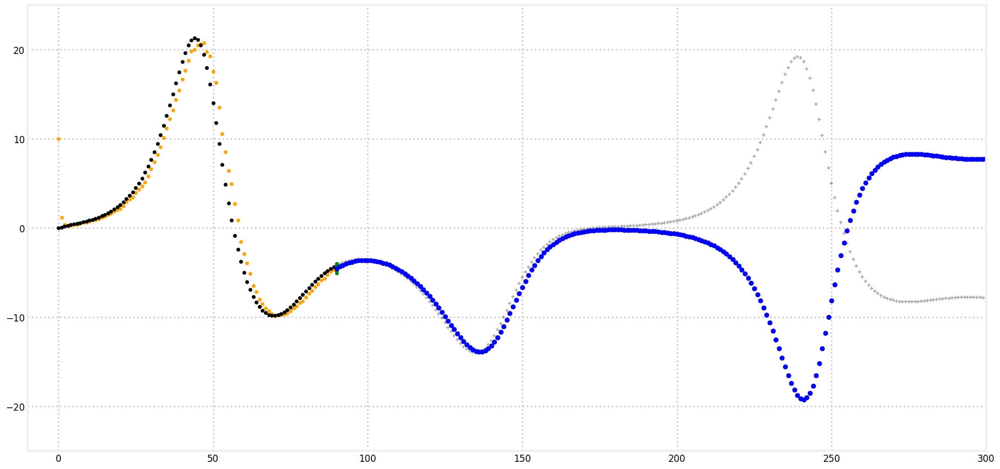

In [22]:
args = []
kwargs = {}
figsize=(20,10)
step = 90
contador = 0
font = 30
#def gif(step=4,contador=0,*args,figsize=(20,10),**kwargs):
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111)
plt.ylim(-25,25)
plt.xlim(-10,300)

ax.scatter(range(len(states[:,0][:step])),states[:,0][:step],label='Prior best estimates',color='orange',s=20)
ax.scatter(range(len(xs[:step])),xs[:step],label='Past measurements',color='black',s=20)
ax.scatter(range(step,len(xs[step:])+step),xs[step:],label='Future measurements',marker='+',alpha=0.3,color='black',s=20)
for scx,scy in zip(np.ones(len(sigmas[step][:,0]))*step,sigmas[step][:,0]):
    ax.scatter(scx,scy,color='green',s=20)

ensembles = sigmas[step][:,0]
posterior = states[step]
#posterior = np.array([xs[step],vxs[step],ys[step],vys[step],zs[step],vzs[step]])
ax.scatter(step,posterior[
    0],color='red',label='',s=30) 

#posterior = [xs[step],vxs[step],ys[step],vys[step],zs[step],vzs[step]]
#posterior 

xp,yp,zp = [posterior[0]],[posterior[2]],[posterior[4]]
vxp,vyp,vzp = [],[],[]

for i,j in enumerate(range(len(xs))):
    vxpi,vypi,vzpi = lorenz(xp[i],yp[i],zp[i])
    xp.append(xp[i] + (vxpi * dt))
    yp.append(yp[i] + (vypi * dt))
    zp.append(zp[i] + (vzpi * dt))
    vxp.append(vxpi)
    vyp.append(vypi)
    vzp.append(vzpi)
    
ax.scatter(range(step,len(xp)+step),xp,color='b')



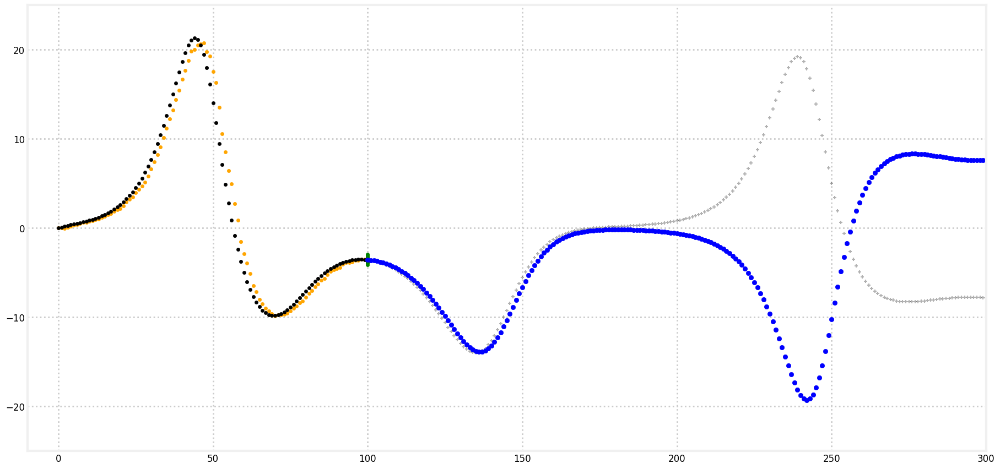

In [234]:
args = []
kwargs = {}
figsize=(20,10)
step = 100
contador = 0
font = 30
#def gif(step=4,contador=0,*args,figsize=(20,10),**kwargs):
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111)
plt.ylim(-25,25)
plt.xlim(-10,300)

ax.scatter(range(len(states[:,0][:step])),states[:,0][:step],label='Prior best estimates',color='orange',s=20)
ax.scatter(range(len(xs[:step])),xs[:step],label='Past measurements',color='black',s=20)
ax.scatter(range(step,len(xs[step:])+step),xs[step:],label='Future measurements',marker='+',alpha=0.3,color='black',s=20)
for scx,scy in zip(np.ones(len(sigmas[step][:,0]))*step,sigmas[step][:,0]):
    ax.scatter(scx,scy,color='green',s=20)

ensembles = sigmas[step][:,0]
posterior = states[step]
#posterior = np.array([xs[step],vxs[step],ys[step],vys[step],zs[step],vzs[step]])
ax.scatter(step,posterior[
    0],color='red',label='',s=30) 

#posterior = [xs[step],vxs[step],ys[step],vys[step],zs[step],vzs[step]]
#posterior 

xp,yp,zp = [posterior[0]],[posterior[2]],[posterior[4]]
vxp,vyp,vzp = [],[],[]

for i,j in enumerate(range(len(xs))):
    vxpi,vypi,vzpi = lorenz(xp[i],yp[i],zp[i])
    xp.append(xp[i] + (vxpi * dt))
    yp.append(yp[i] + (vypi * dt))
    zp.append(zp[i] + (vzpi * dt))
    vxp.append(vxpi)
    vyp.append(vypi)
    vzp.append(vzpi)
    
ax.scatter(range(step,len(xp)+step),xp,color='b')

